# Terminal Assignment-Based Assessment

# Part A. Time Series Analysis on Weather data

# Importing libraries

In [2]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [1]:
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import calendar
from datetime import datetime
import plotly.express as px
import plotly.io as pio
from plotly.subplots import make_subplots
from pandas.plotting import register_matplotlib_converters
import pandas as pd
import numpy as np
import seaborn as sns
import statsmodels.api as sm
import matplotlib.pyplot as plt
import scipy.stats as stats
import warnings
from itertools import product  
from scipy.stats import zscore
from scipy import stats
from numpy import random
from statsmodels.tsa.arima.model import ARIMA
from math import sqrt
import itertools
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import r2_score 
from statsmodels.stats.diagnostic import acorr_ljungbox

# Reading the csv file

In [2]:
w_df = pd.read_csv("C:\\Users\\HP\\Desktop\\Stats TABA\\weather_revised.csv")

In [3]:
print(w_df.head(5))

              date  maxtp(Maximum Air Temperature - degrees C)  \
0  01 January 1942                                         9.7   
1  02 January 1942                                         9.9   
2  03 January 1942                                        11.2   
3  04 January 1942                                         9.2   
4  05 January 1942                                         3.5   

   mintp(Minimum Air Temperature - degrees C)  \
0                                         6.8   
1                                         7.9   
2                                         8.9   
3                                         2.7   
4                                        -0.8   

  gmin(Grass Minimum Temperature - degrees C)  \
0                                         4.7   
1                                         6.7   
2                                         7.2   
3                                         3.4   
4                                           0   

   rain(Preci

# Exlporatory Data Analysis

# Dataset summary

In [4]:
w_df.shape

(29889, 9)

the dataset has 29889 rows and 9 features

In [5]:
print(w_df.describe())

       maxtp(Maximum Air Temperature - degrees C)  \
count                                29889.000000   
mean                                    13.064900   
std                                      4.908828   
min                                     -4.700000   
25%                                      9.400000   
50%                                     13.000000   
75%                                     16.900000   
max                                     29.100000   

       mintp(Minimum Air Temperature - degrees C)  \
count                                29889.000000   
mean                                     6.157051   
std                                      4.383088   
min                                    -12.200000   
25%                                      2.900000   
50%                                      6.300000   
75%                                      9.600000   
max                                     18.400000   

       rain(Precipitation Amount - mm)  cbl 

this describes the count, mean, max, standard dev, and qaurtiles for every feature

In [6]:
print(w_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29889 entries, 0 to 29888
Data columns (total 9 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   date                                         29889 non-null  object 
 1   maxtp(Maximum Air Temperature - degrees C)   29889 non-null  float64
 2   mintp(Minimum Air Temperature - degrees C)   29889 non-null  float64
 3   gmin(Grass Minimum Temperature - degrees C)  29889 non-null  object 
 4   rain(Precipitation Amount - mm)              29889 non-null  float64
 5   cbl (Mean CBL Pressure-hpa)                  29889 non-null  float64
 6   wdsp(Mean Wind Speed - knot)                 29889 non-null  float64
 7   pe(Potential Evapotranspiration - mm)        29889 non-null  float64
 8   evap(Evaporation -mm)                        29889 non-null  object 
dtypes: float64(6), object(3)
memory usage: 2.1+ MB
None


this defines the datatypes of every feature

#### copying the dataset for convenience

In [7]:
df_analysis=w_df

## Null or blank value removal

### for df_analysis

In [8]:
def is_blank(value):
    return isinstance(value, str) and value.strip() == ''

blank_values = df_analysis.applymap(is_blank)
print("DataFrame with Blank Values:")
print(blank_values.head(5))
blank_count = blank_values.sum()
print("Count of Blank Values in Column:", blank_count)

DataFrame with Blank Values:
    date  maxtp(Maximum Air Temperature - degrees C)  \
0  False                                       False   
1  False                                       False   
2  False                                       False   
3  False                                       False   
4  False                                       False   

   mintp(Minimum Air Temperature - degrees C)  \
0                                       False   
1                                       False   
2                                       False   
3                                       False   
4                                       False   

   gmin(Grass Minimum Temperature - degrees C)  \
0                                        False   
1                                        False   
2                                        False   
3                                        False   
4                                        False   

   rain(Precipitation Amount - mm)  cb

C:\Users\HP\AppData\Local\Temp\ipykernel_14500\1637762967.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  blank_values = df_analysis.applymap(is_blank)


In [9]:
def is_blank_space(value):
    return isinstance(value, str) and value.strip() == ''
blank_space_rows = df_analysis.applymap(is_blank_space).any(axis=1)
df_analysis = df_analysis[~blank_space_rows]

print("DataFrame after removing rows with object-type blank spaces:")
print(df_analysis)

DataFrame after removing rows with object-type blank spaces:
                  date  maxtp(Maximum Air Temperature - degrees C)  \
0      01 January 1942                                         9.7   
1      02 January 1942                                         9.9   
2      03 January 1942                                        11.2   
3      04 January 1942                                         9.2   
4      05 January 1942                                         3.5   
...                ...                                         ...   
29884  27 October 2023                                        13.2   
29885  28 October 2023                                        14.1   
29886  29 October 2023                                        12.4   
29887  30 October 2023                                        12.7   
29888  31 October 2023                                        12.3   

       mintp(Minimum Air Temperature - degrees C)  \
0                                            

C:\Users\HP\AppData\Local\Temp\ipykernel_14500\1960775292.py:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  blank_space_rows = df_analysis.applymap(is_blank_space).any(axis=1)


In [10]:
def is_blank(value):
    return isinstance(value, str) and value.strip() == ''
blank_values = df_analysis.applymap(is_blank)
blank_count = blank_values.sum()
print("Count of Blank Values in Column:", blank_count)

Count of Blank Values in Column: date                                           0
maxtp(Maximum Air Temperature - degrees C)     0
mintp(Minimum Air Temperature - degrees C)     0
gmin(Grass Minimum Temperature - degrees C)    0
rain(Precipitation Amount - mm)                0
cbl (Mean CBL Pressure-hpa)                    0
wdsp(Mean Wind Speed - knot)                   0
pe(Potential Evapotranspiration - mm)          0
evap(Evaporation -mm)                          0
dtype: int64


C:\Users\HP\AppData\Local\Temp\ipykernel_14500\2411241800.py:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  blank_values = df_analysis.applymap(is_blank)


In [11]:
print(df_analysis.shape)

(29882, 9)


### for w_df

In [12]:
def is_blank_space(value):
    return isinstance(value, str) and value.strip() == ''
blank_space_rows = w_df.applymap(is_blank_space).any(axis=1)
w_df = w_df[~blank_space_rows]

print("DataFrame after removing rows with object-type blank spaces:")
print(w_df.head(5))
w_df.shape

DataFrame after removing rows with object-type blank spaces:
              date  maxtp(Maximum Air Temperature - degrees C)  \
0  01 January 1942                                         9.7   
1  02 January 1942                                         9.9   
2  03 January 1942                                        11.2   
3  04 January 1942                                         9.2   
4  05 January 1942                                         3.5   

   mintp(Minimum Air Temperature - degrees C)  \
0                                         6.8   
1                                         7.9   
2                                         8.9   
3                                         2.7   
4                                        -0.8   

  gmin(Grass Minimum Temperature - degrees C)  \
0                                         4.7   
1                                         6.7   
2                                         7.2   
3                                         3.4   
4 

C:\Users\HP\AppData\Local\Temp\ipykernel_14500\1517215720.py:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  blank_space_rows = w_df.applymap(is_blank_space).any(axis=1)


(29882, 9)

In [13]:
def is_blank(value):
    return isinstance(value, str) and value.strip() == ''
blank_values = w_df.applymap(is_blank)
blank_count = blank_values.sum()
print("Count of Blank Values in Column:", blank_count)

Count of Blank Values in Column: date                                           0
maxtp(Maximum Air Temperature - degrees C)     0
mintp(Minimum Air Temperature - degrees C)     0
gmin(Grass Minimum Temperature - degrees C)    0
rain(Precipitation Amount - mm)                0
cbl (Mean CBL Pressure-hpa)                    0
wdsp(Mean Wind Speed - knot)                   0
pe(Potential Evapotranspiration - mm)          0
evap(Evaporation -mm)                          0
dtype: int64


C:\Users\HP\AppData\Local\Temp\ipykernel_14500\2938945563.py:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  blank_values = w_df.applymap(is_blank)


In [14]:
w_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29882 entries, 0 to 29888
Data columns (total 9 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   date                                         29882 non-null  object 
 1   maxtp(Maximum Air Temperature - degrees C)   29882 non-null  float64
 2   mintp(Minimum Air Temperature - degrees C)   29882 non-null  float64
 3   gmin(Grass Minimum Temperature - degrees C)  29882 non-null  object 
 4   rain(Precipitation Amount - mm)              29882 non-null  float64
 5   cbl (Mean CBL Pressure-hpa)                  29882 non-null  float64
 6   wdsp(Mean Wind Speed - knot)                 29882 non-null  float64
 7   pe(Potential Evapotranspiration - mm)        29882 non-null  float64
 8   evap(Evaporation -mm)                        29882 non-null  object 
dtypes: float64(6), object(3)
memory usage: 2.3+ MB


## converting object type date column to date type for extraction

In [15]:
df_analysis['date'] = pd.to_datetime(df_analysis['date'])

In [16]:
df_analysis.head(5)

,date,maxtp(Maximum Air Temperature - degrees C),mintp(Minimum Air Temperature - degrees C),gmin(Grass Minimum Temperature - degrees C),rain(Precipitation Amount - mm),cbl (Mean CBL Pressure-hpa),wdsp(Mean Wind Speed - knot),pe(Potential Evapotranspiration - mm),evap(Evaporation -mm)
0,1942-01-01,9.7,6.8,4.7,0.0,1020.3,17.2,1.1,1.4
1,1942-01-02,9.9,7.9,6.7,0.1,1016.2,15.2,0.7,0.9
2,1942-01-03,11.2,8.9,7.2,1.5,1006.8,14.0,0.5,0.6
3,1942-01-04,9.2,2.7,3.4,3.5,1001.5,17.0,0.6,0.7
4,1942-01-05,3.5,-0.8,0,0.6,1013.4,13.0,0.6,0.7


In [17]:
print(df_analysis.dtypes)

date                                           datetime64[ns]
maxtp(Maximum Air Temperature - degrees C)            float64
mintp(Minimum Air Temperature - degrees C)            float64
gmin(Grass Minimum Temperature - degrees C)            object
rain(Precipitation Amount - mm)                       float64
cbl (Mean CBL Pressure-hpa)                           float64
wdsp(Mean Wind Speed - knot)                          float64
pe(Potential Evapotranspiration - mm)                 float64
evap(Evaporation -mm)                                  object
dtype: object


## extracting day, week, month

In [18]:
df_analysis['day_of_month'] = df_analysis['date'].dt.strftime('%A')
df_analysis['week_of_year'] = df_analysis['date'].dt.isocalendar().week
df_analysis['month_of_year'] = df_analysis['date'].dt.strftime('%B')
df_analysis['year'] = df_analysis['date'].dt.year
print(df_analysis)

            date  maxtp(Maximum Air Temperature - degrees C)  \
0     1942-01-01                                         9.7   
1     1942-01-02                                         9.9   
2     1942-01-03                                        11.2   
3     1942-01-04                                         9.2   
4     1942-01-05                                         3.5   
...          ...                                         ...   
29884 2023-10-27                                        13.2   
29885 2023-10-28                                        14.1   
29886 2023-10-29                                        12.4   
29887 2023-10-30                                        12.7   
29888 2023-10-31                                        12.3   

       mintp(Minimum Air Temperature - degrees C)  \
0                                             6.8   
1                                             7.9   
2                                             8.9   
3                  

## arranging columns in order

In [19]:
column_order=['year','month_of_year','week_of_year','day_of_month','date','maxtp(Maximum Air Temperature - degrees C)','mintp(Minimum Air Temperature - degrees C)','gmin(Grass Minimum Temperature - degrees C)','rain(Precipitation Amount - mm)','cbl (Mean CBL Pressure-hpa)','wdsp(Mean Wind Speed - knot)','pe(Potential Evapotranspiration - mm)','evap(Evaporation -mm)']

In [20]:
new_df=df_analysis[column_order]

In [21]:
print(new_df.head(2))
new_df.shape

   year month_of_year  week_of_year day_of_month       date  \
0  1942       January             1     Thursday 1942-01-01   
1  1942       January             1       Friday 1942-01-02   

   maxtp(Maximum Air Temperature - degrees C)  \
0                                         9.7   
1                                         9.9   

   mintp(Minimum Air Temperature - degrees C)  \
0                                         6.8   
1                                         7.9   

  gmin(Grass Minimum Temperature - degrees C)  \
0                                         4.7   
1                                         6.7   

   rain(Precipitation Amount - mm)  cbl (Mean CBL Pressure-hpa)  \
0                              0.0                       1020.3   
1                              0.1                       1016.2   

   wdsp(Mean Wind Speed - knot)  pe(Potential Evapotranspiration - mm)  \
0                          17.2                                    1.1   
1               

(29882, 13)

In [22]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29882 entries, 0 to 29888
Data columns (total 13 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   year                                         29882 non-null  int32         
 1   month_of_year                                29882 non-null  object        
 2   week_of_year                                 29882 non-null  UInt32        
 3   day_of_month                                 29882 non-null  object        
 4   date                                         29882 non-null  datetime64[ns]
 5   maxtp(Maximum Air Temperature - degrees C)   29882 non-null  float64       
 6   mintp(Minimum Air Temperature - degrees C)   29882 non-null  float64       
 7   gmin(Grass Minimum Temperature - degrees C)  29882 non-null  object        
 8   rain(Precipitation Amount - mm)              29882 non-null  float64       
 9   

In [23]:
def is_blank(value):
    return isinstance(value, str) and value.strip() == ''
blank_values = new_df.applymap(is_blank)
print("DataFrame with Blank Values:")
print(blank_values)
blank_count = blank_values.sum()
print("Count of Blank Values in Column:", blank_count)

DataFrame with Blank Values:
        year  month_of_year  week_of_year  day_of_month   date  \
0      False          False         False         False  False   
1      False          False         False         False  False   
2      False          False         False         False  False   
3      False          False         False         False  False   
4      False          False         False         False  False   
...      ...            ...           ...           ...    ...   
29884  False          False         False         False  False   
29885  False          False         False         False  False   
29886  False          False         False         False  False   
29887  False          False         False         False  False   
29888  False          False         False         False  False   

       maxtp(Maximum Air Temperature - degrees C)  \
0                                           False   
1                                           False   
2                  

C:\Users\HP\AppData\Local\Temp\ipykernel_14500\2214025535.py:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  blank_values = new_df.applymap(is_blank)


## checking date range

In [24]:
min_date = new_df['date'].min()
max_date = new_df['date'].max()
print("Min Date:", min_date)
print("Max Date:", max_date)

Min Date: 1942-01-01 00:00:00
Max Date: 2023-10-31 00:00:00


# Visualizations

### Aggregated Air Temperture by Year

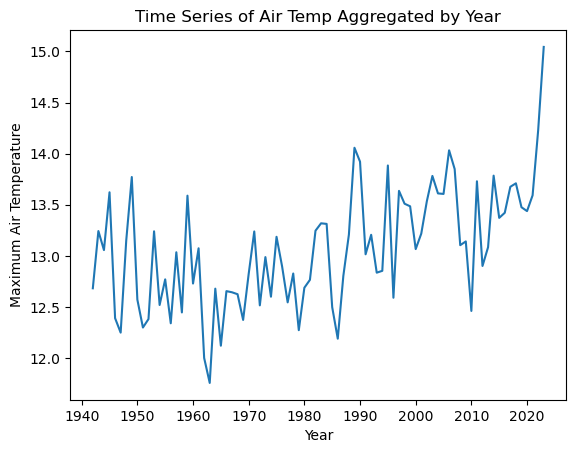

In [25]:
df_aggregated = new_df.groupby('year')['maxtp(Maximum Air Temperature - degrees C)'].mean()
plt.plot(df_aggregated.index, df_aggregated.values)
plt.xlabel('Year')
plt.ylabel('Maximum Air Temperature')
plt.title('Time Series of Air Temp Aggregated by Year')
plt.show()

### Year wise Monthly avg Temp

In [26]:
df_ym=new_df
df_ym['yearmonth'] = new_df['date'].dt.to_period('M')
ym_avg_temp = df_ym.groupby('yearmonth')['maxtp(Maximum Air Temperature - degrees C)'].mean().round(1).reset_index()
ym_avg_temp['label'] = ym_avg_temp.apply(lambda row: f"Period: {row['yearmonth']}\nTemperature: {row['maxtp(Maximum Air Temperature - degrees C)']}", axis=1)
print(ym_avg_temp)

    yearmonth  maxtp(Maximum Air Temperature - degrees C)  \
0     1942-01                                         6.9   
1     1942-02                                         5.8   
2     1942-03                                         9.4   
3     1942-04                                        11.9   
4     1942-05                                        14.4   
..        ...                                         ...   
977   2023-06                                        19.7   
978   2023-07                                        18.6   
979   2023-08                                        19.3   
980   2023-09                                        18.7   
981   2023-10                                        15.0   

                                  label  
0     Period: 1942-01\nTemperature: 6.9  
1     Period: 1942-02\nTemperature: 5.8  
2     Period: 1942-03\nTemperature: 9.4  
3    Period: 1942-04\nTemperature: 11.9  
4    Period: 1942-05\nTemperature: 14.4  
..             

C:\Users\HP\AppData\Local\Temp\ipykernel_14500\2585042573.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ym['yearmonth'] = new_df['date'].dt.to_period('M')


In [27]:
ym_avg_temp2=ym_avg_temp

In [28]:
print(ym_avg_temp['label'].head(5))
ym_avg_temp.shape

0     Period: 1942-01\nTemperature: 6.9
1     Period: 1942-02\nTemperature: 5.8
2     Period: 1942-03\nTemperature: 9.4
3    Period: 1942-04\nTemperature: 11.9
4    Period: 1942-05\nTemperature: 14.4
Name: label, dtype: object


(982, 3)

pip install plotly --upgrade

In [29]:
print(list(pio.templates))

['ggplot2', 'seaborn', 'simple_white', 'plotly', 'plotly_white', 'plotly_dark', 'presentation', 'xgridoff', 'ygridoff', 'gridon', 'none']


In [30]:
ym_avg_temp['yearmonth'] = ym_avg_temp['yearmonth'].astype(str)
plot1 = px.line(ym_avg_temp, x='yearmonth', y='maxtp(Maximum Air Temperature - degrees C)', line_shape='linear', labels={'maxtp(Maximum Air Temperature - degrees C)': 'Temperature'})
plot1.update_traces(mode='markers+lines', marker=dict(color='orange'), text=ym_avg_temp['label'])

plot1.update_layout(
    title="Monthly Average Temperature Plot",
    xaxis_title="Period",
    yaxis_title="Temperature",
    title_font=dict(size=14, family="bold"),
    template='plotly_dark'
)
plot1.show()

In [31]:
print(ym_avg_temp2.head(5))
ym_avg_temp2.info()

  yearmonth  maxtp(Maximum Air Temperature - degrees C)  \
0   1942-01                                         6.9   
1   1942-02                                         5.8   
2   1942-03                                         9.4   
3   1942-04                                        11.9   
4   1942-05                                        14.4   

                                label  
0   Period: 1942-01\nTemperature: 6.9  
1   Period: 1942-02\nTemperature: 5.8  
2   Period: 1942-03\nTemperature: 9.4  
3  Period: 1942-04\nTemperature: 11.9  
4  Period: 1942-05\nTemperature: 14.4  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 982 entries, 0 to 981
Data columns (total 3 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   yearmonth                                   982 non-null    object 
 1   maxtp(Maximum Air Temperature - degrees C)  982 non-null    float64
 2   labe

In [32]:
ym_avg_temp2['yearmonth'] = pd.to_datetime(ym_avg_temp2['yearmonth'])
ym_avg_temp2['year'] = ym_avg_temp2['yearmonth'].dt.year
ym_avg_temp2['year'] = ym_avg_temp2['year'].astype(str)

In [33]:
ym_avg_temp['year'] = ym_avg_temp['yearmonth'].dt.year
ym_avg_temp['yearmonth'] = ym_avg_temp['yearmonth'].astype(str)
ym_avg_temp['year'] = ym_avg_temp['year'].astype(str)

plot1 = px.line(ym_avg_temp, x='yearmonth', y='maxtp(Maximum Air Temperature - degrees C)', line_shape='linear',
                labels={'maxtp(Maximum Air Temperature - degrees C)': 'Temperature'}, color='year')

plot1.update_traces(mode='markers+lines', marker=dict(color='orange'), text=ym_avg_temp['label'])

plot1.update_layout(
    title="Monthly Average Temperature",
    xaxis_title="Period",
    yaxis_title="Temperature",
    title_font=dict(size=14, family="bold"),
    template='plotly_dark'
)

plot1.show()

### Year wise Max Temp plot.

In [34]:
print(ym_avg_temp2.head(5))
ym_avg_temp2.shape

    yearmonth  maxtp(Maximum Air Temperature - degrees C)  \
0  1942-01-01                                         6.9   
1  1942-02-01                                         5.8   
2  1942-03-01                                         9.4   
3  1942-04-01                                        11.9   
4  1942-05-01                                        14.4   

                                label  year  
0   Period: 1942-01\nTemperature: 6.9  1942  
1   Period: 1942-02\nTemperature: 5.8  1942  
2   Period: 1942-03\nTemperature: 9.4  1942  
3  Period: 1942-04\nTemperature: 11.9  1942  
4  Period: 1942-05\nTemperature: 14.4  1942  


(982, 4)

In [35]:
ym_avg_temp2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 982 entries, 0 to 981
Data columns (total 4 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   yearmonth                                   982 non-null    object 
 1   maxtp(Maximum Air Temperature - degrees C)  982 non-null    float64
 2   label                                       982 non-null    object 
 3   year                                        982 non-null    object 
dtypes: float64(1), object(3)
memory usage: 30.8+ KB


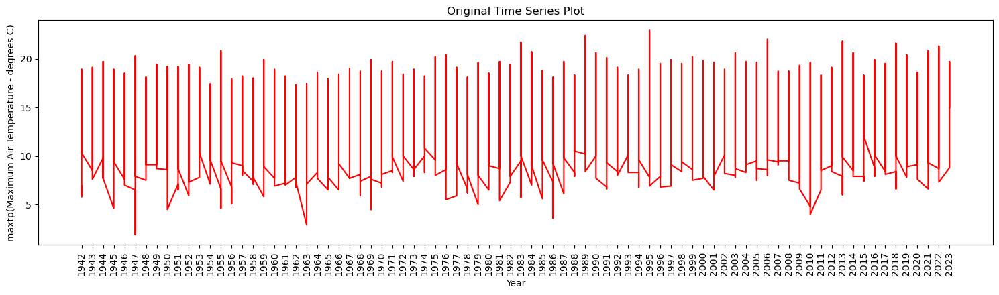

In [36]:
ym_avg_temp2.set_index('year', inplace=True)
ym_avg_temp2_ts = pd.Series(ym_avg_temp2['maxtp(Maximum Air Temperature - degrees C)'].values,index=ym_avg_temp2.index)
    
plt.figure(figsize=(15, 8))
plt.subplot(2, 1, 1)
plt.plot(ym_avg_temp2_ts, color='red')
plt.title('Original Time Series Plot')
plt.xlabel('Year')
plt.ylabel('maxtp(Maximum Air Temperature - degrees C)')
plt.xticks(rotation=90) 
plt.tight_layout() 

### Decomposition the time series to check the trend

In [37]:
new_df.shape

(29882, 14)

In [38]:
new_df

,year,month_of_year,week_of_year,day_of_month,date,maxtp(Maximum Air Temperature - degrees C),mintp(Minimum Air Temperature - degrees C),gmin(Grass Minimum Temperature - degrees C),rain(Precipitation Amount - mm),cbl (Mean CBL Pressure-hpa),wdsp(Mean Wind Speed - knot),pe(Potential Evapotranspiration - mm),evap(Evaporation -mm),yearmonth
0,1942,January,1,Thursday,1942-01-01,9.7,6.8,4.7,0.0,1020.3,17.2,1.1,1.4,1942-01
1,1942,January,1,Friday,1942-01-02,9.9,7.9,6.7,0.1,1016.2,15.2,0.7,0.9,1942-01
2,1942,January,1,Saturday,1942-01-03,11.2,8.9,7.2,1.5,1006.8,14.0,0.5,0.6,1942-01
3,1942,January,1,Sunday,1942-01-04,9.2,2.7,3.4,3.5,1001.5,17.0,0.6,0.7,1942-01
4,1942,January,2,Monday,1942-01-05,3.5,-0.8,0,0.6,1013.4,13.0,0.6,0.7,1942-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29884,2023,October,43,Friday,2023-10-27,13.2,4.1,-1,2.9,974.2,5.8,0.5,0.8,2023-10
29885,2023,October,43,Saturday,2023-10-28,14.1,9.3,7.2,4.4,970.1,8.5,0.7,1,2023-10
29886,2023,October,43,Sunday,2023-10-29,12.4,2.5,-1.2,11.1,972.0,5.2,0.4,0.6,2023-10
29887,2023,October,44,Monday,2023-10-30,12.7,1.7,-1.3,2.1,979.9,4.1,0.3,0.5,2023-10


In [39]:
new_df.shape

(29882, 14)

In [40]:
new_df

,year,month_of_year,week_of_year,day_of_month,date,maxtp(Maximum Air Temperature - degrees C),mintp(Minimum Air Temperature - degrees C),gmin(Grass Minimum Temperature - degrees C),rain(Precipitation Amount - mm),cbl (Mean CBL Pressure-hpa),wdsp(Mean Wind Speed - knot),pe(Potential Evapotranspiration - mm),evap(Evaporation -mm),yearmonth
0,1942,January,1,Thursday,1942-01-01,9.7,6.8,4.7,0.0,1020.3,17.2,1.1,1.4,1942-01
1,1942,January,1,Friday,1942-01-02,9.9,7.9,6.7,0.1,1016.2,15.2,0.7,0.9,1942-01
2,1942,January,1,Saturday,1942-01-03,11.2,8.9,7.2,1.5,1006.8,14.0,0.5,0.6,1942-01
3,1942,January,1,Sunday,1942-01-04,9.2,2.7,3.4,3.5,1001.5,17.0,0.6,0.7,1942-01
4,1942,January,2,Monday,1942-01-05,3.5,-0.8,0,0.6,1013.4,13.0,0.6,0.7,1942-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29884,2023,October,43,Friday,2023-10-27,13.2,4.1,-1,2.9,974.2,5.8,0.5,0.8,2023-10
29885,2023,October,43,Saturday,2023-10-28,14.1,9.3,7.2,4.4,970.1,8.5,0.7,1,2023-10
29886,2023,October,43,Sunday,2023-10-29,12.4,2.5,-1.2,11.1,972.0,5.2,0.4,0.6,2023-10
29887,2023,October,44,Monday,2023-10-30,12.7,1.7,-1.3,2.1,979.9,4.1,0.3,0.5,2023-10


In [41]:
#creating a copy of the dataframe for later use
df_op = new_df[['date','maxtp(Maximum Air Temperature - degrees C)']].copy()

In [42]:
df_op

,date,maxtp(Maximum Air Temperature - degrees C)
0,1942-01-01,9.7
1,1942-01-02,9.9
2,1942-01-03,11.2
3,1942-01-04,9.2
4,1942-01-05,3.5
...,...,...
29884,2023-10-27,13.2
29885,2023-10-28,14.1
29886,2023-10-29,12.4
29887,2023-10-30,12.7


<Figure size 15000x12000 with 0 Axes>

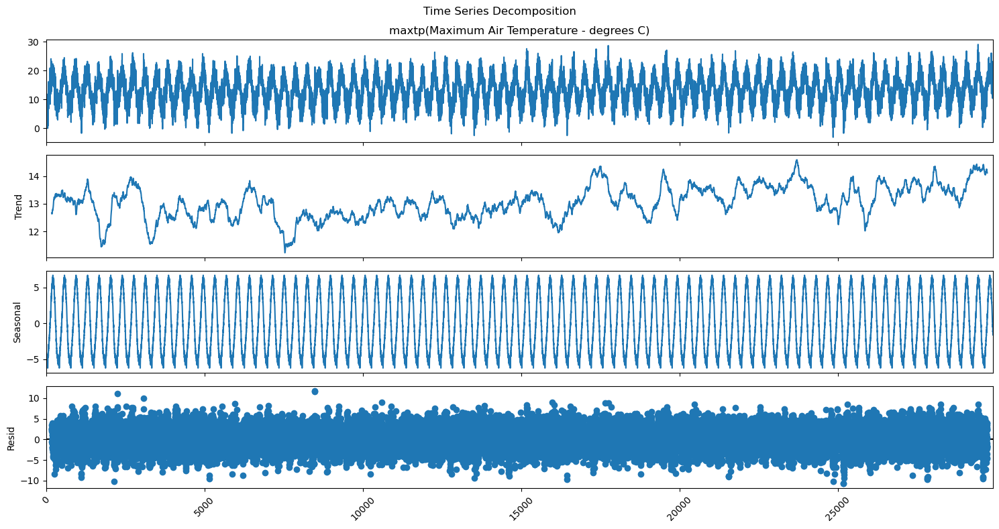

In [44]:
result = seasonal_decompose(df_op['maxtp(Maximum Air Temperature - degrees C)'], model='additive',period=365)
plt.rcParams['figure.figsize'] = (15, 8)

if len(result.trend.dropna()) > 2:
    plt.figure(figsize=(150, 120))
    result.plot().suptitle('Time Series Decomposition')
    plt.xticks(rotation=45)  
    plt.tight_layout()  
    plt.show()
else:
    print("Not enough data points for decomposition.")

In [45]:
df_dateYear = new_df
print(df_dateYear.head(5))

   year month_of_year  week_of_year day_of_month       date  \
0  1942       January             1     Thursday 1942-01-01   
1  1942       January             1       Friday 1942-01-02   
2  1942       January             1     Saturday 1942-01-03   
3  1942       January             1       Sunday 1942-01-04   
4  1942       January             2       Monday 1942-01-05   

   maxtp(Maximum Air Temperature - degrees C)  \
0                                         9.7   
1                                         9.9   
2                                        11.2   
3                                         9.2   
4                                         3.5   

   mintp(Minimum Air Temperature - degrees C)  \
0                                         6.8   
1                                         7.9   
2                                         8.9   
3                                         2.7   
4                                        -0.8   

  gmin(Grass Minimum Temperatur

## Daily Maximum Temperature Time Series Grouped by Year

In [46]:
df_dateYear['year'] = df_dateYear['date'].dt.year
df_aggregated = df_dateYear.groupby(['year', 'date'])['maxtp(Maximum Air Temperature - degrees C)'].max().reset_index()

fig = px.line(df_aggregated, x='date', y='maxtp(Maximum Air Temperature - degrees C)', color='year', labels={'maxtp(Maximum Air Temperature - degrees C)': 'Maximum Temperature'})
fig.update_layout(
    title='Daily Maximum Temperature Time Series Grouped by Year',
    xaxis_title='Date',
    yaxis_title='Maximum Temperature',
    template='plotly_dark'
    #template='ggplot2'
)
fig.show()


C:\Users\HP\AppData\Local\Temp\ipykernel_14500\3956114209.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



C:\Users\HP\AppData\Local\Temp\ipykernel_14500\1285417983.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



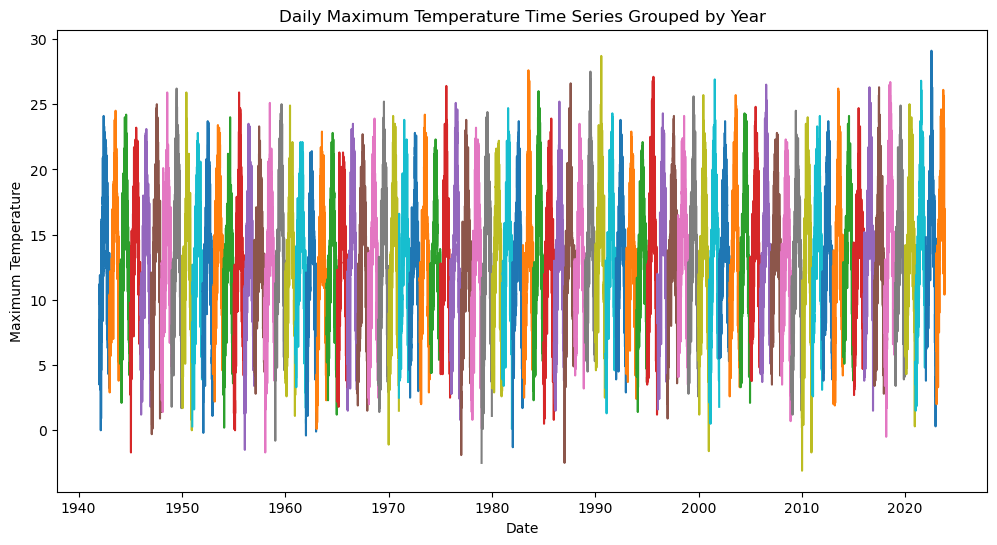

In [47]:
import calendar
import matplotlib.pyplot as plt
df_dateYear['year'] = df_dateYear['date'].dt.year
df_aggregated = df_dateYear.groupby(['year', 'date'])['maxtp(Maximum Air Temperature - degrees C)'].max().reset_index()
plt.figure(figsize=(12, 6))
for year, group in df_aggregated.groupby('year'):
    plt.plot(group['date'], group['maxtp(Maximum Air Temperature - degrees C)'], label=str(year))
plt.title('Daily Maximum Temperature Time Series Grouped by Year')
plt.xlabel('Date')
plt.ylabel('Maximum Temperature')
#plt.legend(title='Year', loc='upper left')
plt.show()


In [48]:
df_analysis.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29882 entries, 0 to 29888
Data columns (total 13 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   date                                         29882 non-null  datetime64[ns]
 1   maxtp(Maximum Air Temperature - degrees C)   29882 non-null  float64       
 2   mintp(Minimum Air Temperature - degrees C)   29882 non-null  float64       
 3   gmin(Grass Minimum Temperature - degrees C)  29882 non-null  object        
 4   rain(Precipitation Amount - mm)              29882 non-null  float64       
 5   cbl (Mean CBL Pressure-hpa)                  29882 non-null  float64       
 6   wdsp(Mean Wind Speed - knot)                 29882 non-null  float64       
 7   pe(Potential Evapotranspiration - mm)        29882 non-null  float64       
 8   evap(Evaporation -mm)                        29882 non-null  object        
 9   

In [49]:
w_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29882 entries, 0 to 29888
Data columns (total 9 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   date                                         29882 non-null  object 
 1   maxtp(Maximum Air Temperature - degrees C)   29882 non-null  float64
 2   mintp(Minimum Air Temperature - degrees C)   29882 non-null  float64
 3   gmin(Grass Minimum Temperature - degrees C)  29882 non-null  object 
 4   rain(Precipitation Amount - mm)              29882 non-null  float64
 5   cbl (Mean CBL Pressure-hpa)                  29882 non-null  float64
 6   wdsp(Mean Wind Speed - knot)                 29882 non-null  float64
 7   pe(Potential Evapotranspiration - mm)        29882 non-null  float64
 8   evap(Evaporation -mm)                        29882 non-null  object 
dtypes: float64(6), object(3)
memory usage: 2.3+ MB


In [50]:
df_analysis2=w_df

In [51]:
df_analysis.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29882 entries, 0 to 29888
Data columns (total 13 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   date                                         29882 non-null  datetime64[ns]
 1   maxtp(Maximum Air Temperature - degrees C)   29882 non-null  float64       
 2   mintp(Minimum Air Temperature - degrees C)   29882 non-null  float64       
 3   gmin(Grass Minimum Temperature - degrees C)  29882 non-null  object        
 4   rain(Precipitation Amount - mm)              29882 non-null  float64       
 5   cbl (Mean CBL Pressure-hpa)                  29882 non-null  float64       
 6   wdsp(Mean Wind Speed - knot)                 29882 non-null  float64       
 7   pe(Potential Evapotranspiration - mm)        29882 non-null  float64       
 8   evap(Evaporation -mm)                        29882 non-null  object        
 9   

## converting object to float

In [52]:
df_analysis2['gmin(Grass Minimum Temperature - degrees C)'] = pd.to_numeric(df_analysis2['gmin(Grass Minimum Temperature - degrees C)'], errors='coerce')
df_analysis2['evap(Evaporation -mm)'] = pd.to_numeric(df_analysis2['evap(Evaporation -mm)'], errors='coerce')
df_analysis2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29882 entries, 0 to 29888
Data columns (total 9 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   date                                         29882 non-null  object 
 1   maxtp(Maximum Air Temperature - degrees C)   29882 non-null  float64
 2   mintp(Minimum Air Temperature - degrees C)   29882 non-null  float64
 3   gmin(Grass Minimum Temperature - degrees C)  29882 non-null  float64
 4   rain(Precipitation Amount - mm)              29882 non-null  float64
 5   cbl (Mean CBL Pressure-hpa)                  29882 non-null  float64
 6   wdsp(Mean Wind Speed - knot)                 29882 non-null  float64
 7   pe(Potential Evapotranspiration - mm)        29882 non-null  float64
 8   evap(Evaporation -mm)                        29882 non-null  float64
dtypes: float64(8), object(1)
memory usage: 2.3+ MB


# Data Preparation and Further visualization

## Boxplot before outlier removal

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed 

total columns affected: 8
Boxplot


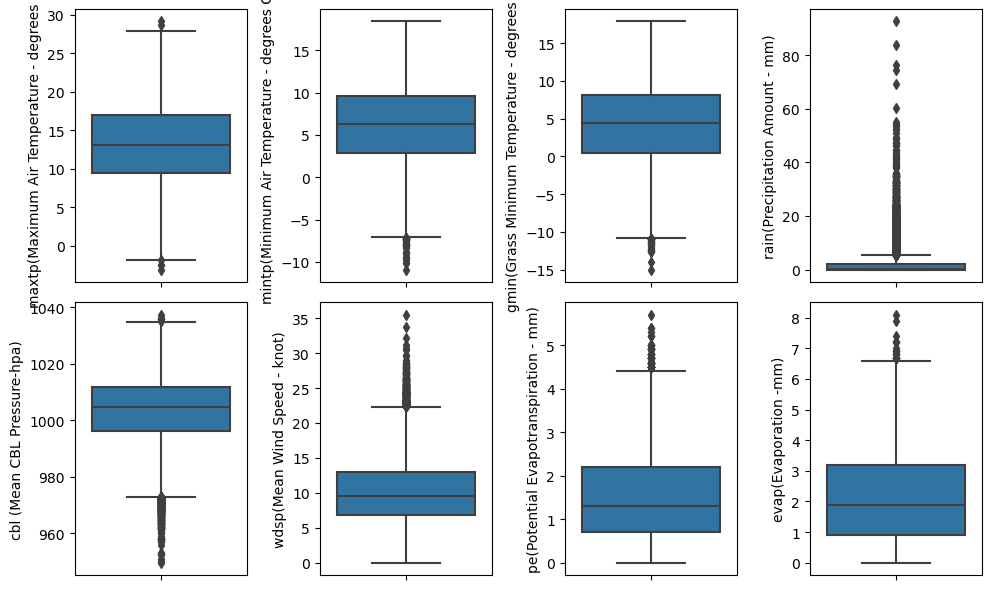

In [53]:
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(10, 6))
axs = axs.flatten()
i = 0
for key,value in df_analysis2.items():
    if pd.api.types.is_integer_dtype(value) or pd.api.types.is_float_dtype(value) :   
        sns.boxplot(y=key, data=df_analysis2, ax=axs[i])
        i=i+1
plt.tight_layout(pad=1, w_pad=1, h_pad=1)
print("total columns affected:", i)
print("Boxplot")

## Outlier percentage check

In [54]:
for key, value in df_analysis2.items():
    if pd.api.types.is_integer_dtype(value) or pd.api.types.is_float_dtype(value):
        q1 = value.quantile(0.25)
        q3 = value.quantile(0.75)
        iqr = q3 - q1
        value_col = value[(value <= q1 - 1.5 * iqr) | (value >= q3 + 1.5 * iqr)]
        perc = np.shape(value_col)[0] * 100.0 / np.shape(df_analysis2)[0]
        print(np.shape(value_col)[0])
        print("%s has Outliers percentage of : %.2f%%" % (key, perc))

6
maxtp(Maximum Air Temperature - degrees C) has Outliers percentage of : 0.02%
27
mintp(Minimum Air Temperature - degrees C) has Outliers percentage of : 0.09%
25
gmin(Grass Minimum Temperature - degrees C) has Outliers percentage of : 0.08%
3565
rain(Precipitation Amount - mm) has Outliers percentage of : 11.93%
336
cbl (Mean CBL Pressure-hpa) has Outliers percentage of : 1.12%
385
wdsp(Mean Wind Speed - knot) has Outliers percentage of : 1.29%
98
pe(Potential Evapotranspiration - mm) has Outliers percentage of : 0.33%
21
evap(Evaporation -mm) has Outliers percentage of : 0.07%


## Outlier removal

In [55]:
z_scores = zscore(df_analysis2.select_dtypes(include=['int', 'float']))
z_scores = abs(z_scores)
outlier_mask = (z_scores > 2).any(axis=1)
df_no_outliers = df_analysis2[~outlier_mask]

In [56]:
df_no_outliers.shape

(23620, 9)

## Saving dataset into excel file for viewing

In [57]:
pip install openpyxl

Note: you may need to restart the kernel to use updated packages.


In [58]:
df_no_outliers.to_excel(r'C:\Users\HP\Desktop\Stats TABA\weather_outlier_rem.xlsx', index=False)

## Boxplot after outlier removal

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed 

total columns affected: 8
Boxplot


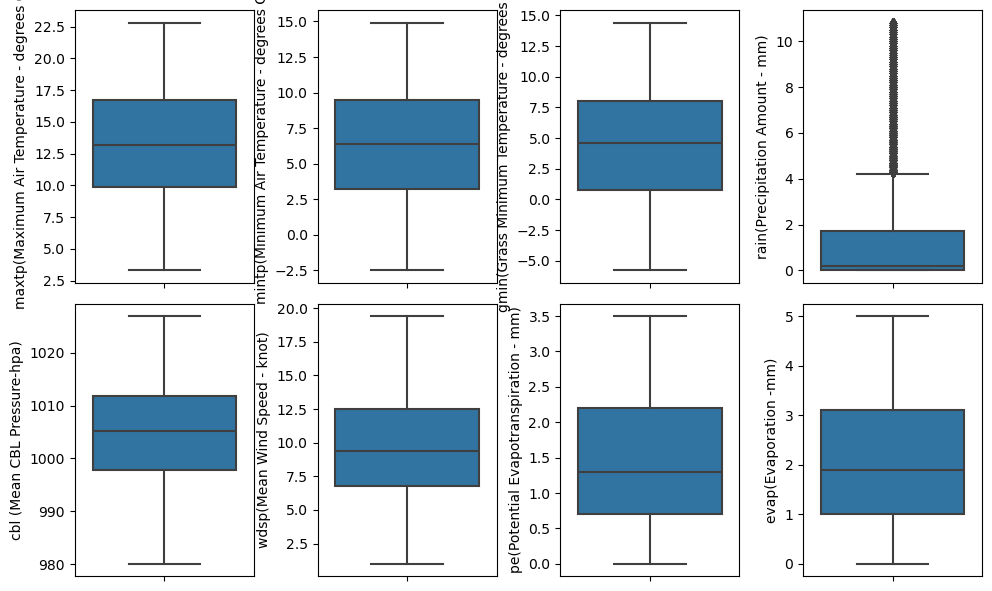

In [57]:
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(10, 6))
axs = axs.flatten()
i = 0
for key,value in df_no_outliers.items():
    if pd.api.types.is_integer_dtype(value) or pd.api.types.is_float_dtype(value) :   
        sns.boxplot(y=key, data=df_no_outliers, ax=axs[i])
        i=i+1
plt.tight_layout(pad=1, w_pad=1, h_pad=1)
print("total columns affected:", i)
print("Boxplot")

In [58]:
for key, value in df_no_outliers.items():
    if pd.api.types.is_integer_dtype(value) or pd.api.types.is_float_dtype(value):
        q1 = value.quantile(0.25)
        q3 = value.quantile(0.75)
        iqr = q3 - q1
        value_col = value[(value <= q1 - 1.5 * iqr) | (value >= q3 + 1.5 * iqr)]
        perc = np.shape(value_col)[0] * 100.0 / np.shape(df_no_outliers)[0]
        print(np.shape(value_col)[0])
        print("%s has Outliers percentage of : %.2f%%" % (key, perc))

0
maxtp(Maximum Air Temperature - degrees C) has Outliers percentage of : 0.00%
0
mintp(Minimum Air Temperature - degrees C) has Outliers percentage of : 0.00%
0
gmin(Grass Minimum Temperature - degrees C) has Outliers percentage of : 0.00%
2680
rain(Precipitation Amount - mm) has Outliers percentage of : 11.35%
0
cbl (Mean CBL Pressure-hpa) has Outliers percentage of : 0.00%
0
wdsp(Mean Wind Speed - knot) has Outliers percentage of : 0.00%
0
pe(Potential Evapotranspiration - mm) has Outliers percentage of : 0.00%
0
evap(Evaporation -mm) has Outliers percentage of : 0.00%


# Modelling

## change date format 

In [65]:
df_no_outliers['date'] = pd.to_datetime(df_no_outliers['date'], format='%d %B %Y')

C:\Users\HP\AppData\Local\Temp\ipykernel_28948\3357396572.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [62]:
print(df_no_outliers['date'])

0       1942-01-01
1       1942-01-02
2       1942-01-03
3       1942-01-04
4       1942-01-05
           ...    
29879   2023-10-22
29880   2023-10-23
29881   2023-10-24
29882   2023-10-25
29888   2023-10-31
Name: date, Length: 23620, dtype: datetime64[ns]


## train test splitting

In [67]:
train = df_no_outliers[(df_no_outliers['date'] >= '2019-01-01') & (df_no_outliers['date'] <= '2022-12-31')]
test = df_no_outliers[(df_no_outliers['date'] >= '2023-01-01') & (df_no_outliers['date'] <= '2023-10-31')]

In [64]:
print(train.head(2))
train.shape

            date  maxtp(Maximum Air Temperature - degrees C)  \
28129 2019-01-06                                        10.1   
28130 2019-01-07                                        11.3   

       mintp(Minimum Air Temperature - degrees C)  \
28129                                         7.8   
28130                                         5.3   

       gmin(Grass Minimum Temperature - degrees C)  \
28129                                          5.3   
28130                                          5.9   

       rain(Precipitation Amount - mm)  cbl (Mean CBL Pressure-hpa)  \
28129                              0.0                       1025.3   
28130                              0.2                       1021.2   

       wdsp(Mean Wind Speed - knot)  pe(Potential Evapotranspiration - mm)  \
28129                           5.2                                    0.5   
28130                          12.7                                    0.6   

       evap(Evaporation -mm)  
2812

(1168, 9)

In [65]:
print(test.head(2))
test.shape

            date  maxtp(Maximum Air Temperature - degrees C)  \
29585 2023-01-01                                         6.8   
29586 2023-01-02                                         6.1   

       mintp(Minimum Air Temperature - degrees C)  \
29585                                         1.3   
29586                                         0.4   

       gmin(Grass Minimum Temperature - degrees C)  \
29585                                         -0.1   
29586                                         -0.5   

       rain(Precipitation Amount - mm)  cbl (Mean CBL Pressure-hpa)  \
29585                              1.1                        991.5   
29586                              0.0                       1002.6   

       wdsp(Mean Wind Speed - knot)  pe(Potential Evapotranspiration - mm)  \
29585                           5.5                                    0.3   
29586                           6.2                                    0.2   

       evap(Evaporation -mm)  
2958

(226, 9)

## Simple time series models

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



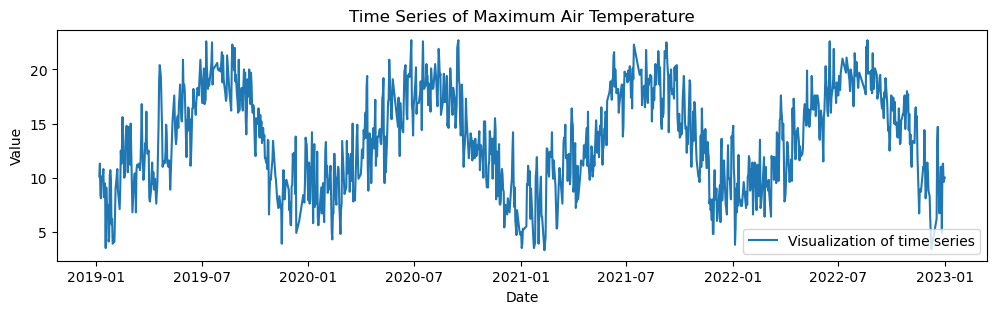

In [66]:
plt.figure(figsize=(12, 3))
sns.lineplot(x='date', y='maxtp(Maximum Air Temperature - degrees C)', data= train, label='Visualization of time series')
plt.title('Time Series of Maximum Air Temperature')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



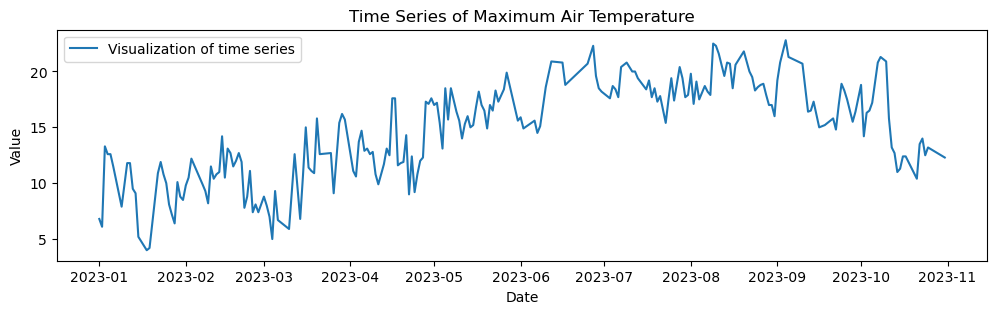

In [67]:
plt.figure(figsize=(12, 3))
sns.lineplot(x='date', y='maxtp(Maximum Air Temperature - degrees C)', data= test, label='Visualization of time series')
plt.title('Time Series of Maximum Air Temperature')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()

# Simple Moving Average

In [124]:
df_no_outliers

,maxtp(Maximum Air Temperature - degrees C),mintp(Minimum Air Temperature - degrees C),gmin(Grass Minimum Temperature - degrees C),rain(Precipitation Amount - mm),cbl (Mean CBL Pressure-hpa),wdsp(Mean Wind Speed - knot),pe(Potential Evapotranspiration - mm),evap(Evaporation -mm),sma
date,,,,,,,,,
1942-01-01,9.7,6.8,4.7,0.0,1020.3,17.2,1.1,1.4,NaN
1942-01-02,9.9,7.9,6.7,0.1,1016.2,15.2,0.7,0.9,NaN
1942-01-03,11.2,8.9,7.2,1.5,1006.8,14.0,0.5,0.6,NaN
1942-01-04,9.2,2.7,3.4,3.5,1001.5,17.0,0.6,0.7,NaN
1942-01-05,3.5,-0.8,0.0,0.6,1013.4,13.0,0.6,0.7,NaN
...,...,...,...,...,...,...,...,...,...
2023-10-22,13.5,3.9,0.8,0.1,991.2,5.5,0.8,1.1,15.015342
2023-10-23,14.0,10.2,-0.4,8.2,992.5,9.6,0.7,1.0,15.001370
2023-10-24,12.5,4.0,8.9,4.0,988.2,6.4,0.4,0.6,14.975616


In [72]:
df_no_outliers

,date,maxtp(Maximum Air Temperature - degrees C),mintp(Minimum Air Temperature - degrees C),gmin(Grass Minimum Temperature - degrees C),rain(Precipitation Amount - mm),cbl (Mean CBL Pressure-hpa),wdsp(Mean Wind Speed - knot),pe(Potential Evapotranspiration - mm),evap(Evaporation -mm)
0,1942-01-01,9.7,6.8,4.7,0.0,1020.3,17.2,1.1,1.4
1,1942-01-02,9.9,7.9,6.7,0.1,1016.2,15.2,0.7,0.9
2,1942-01-03,11.2,8.9,7.2,1.5,1006.8,14.0,0.5,0.6
3,1942-01-04,9.2,2.7,3.4,3.5,1001.5,17.0,0.6,0.7
4,1942-01-05,3.5,-0.8,0.0,0.6,1013.4,13.0,0.6,0.7
...,...,...,...,...,...,...,...,...,...
29879,2023-10-22,13.5,3.9,0.8,0.1,991.2,5.5,0.8,1.1
29880,2023-10-23,14.0,10.2,-0.4,8.2,992.5,9.6,0.7,1.0
29881,2023-10-24,12.5,4.0,8.9,4.0,988.2,6.4,0.4,0.6
29882,2023-10-25,13.2,5.2,0.1,2.7,984.6,6.1,0.6,0.8


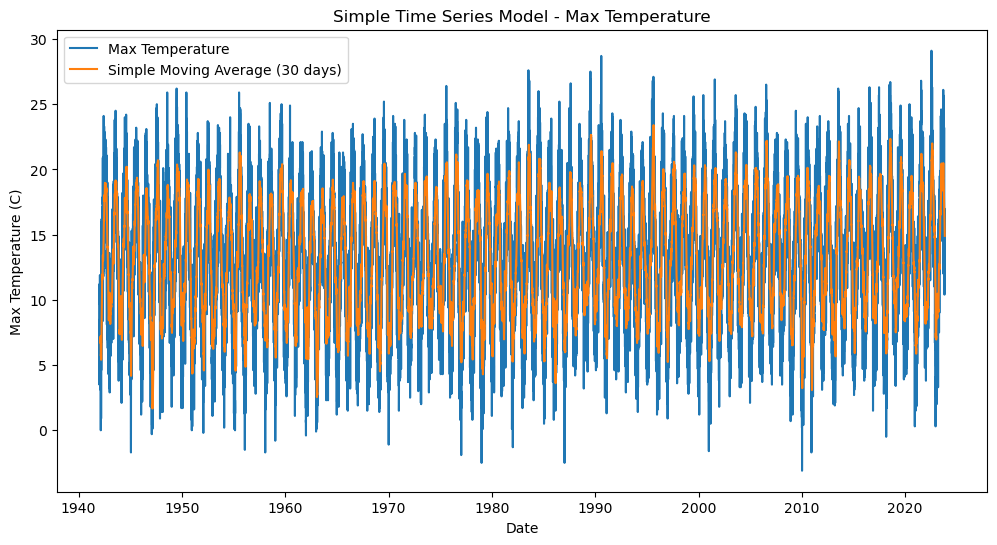

In [158]:
window_size = 30 
df_op['sma'] = df_op['maxtp(Maximum Air Temperature - degrees C)'].rolling(window=window_size).mean()
plt.figure(figsize=(12, 6))
plt.plot(df_op['maxtp(Maximum Air Temperature - degrees C)'], label='Max Temperature')
plt.plot(df_op['sma'], label=f'Simple Moving Average ({window_size} days)')
plt.title('Simple Time Series Model - Max Temperature')
plt.xlabel('Date')
plt.ylabel('Max Temperature (C)')
plt.legend()
plt.show()

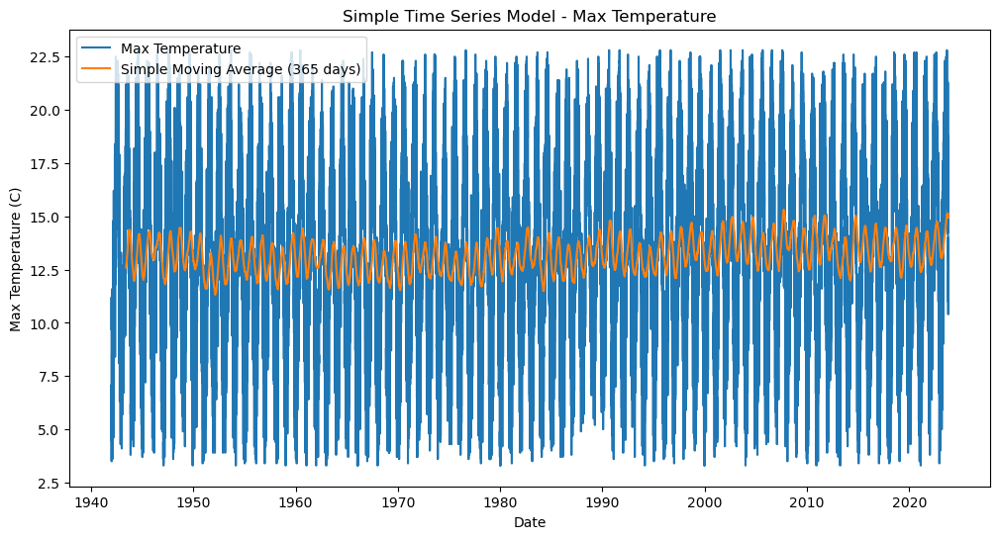

In [159]:
window_size = 365  
df_no_outliers['sma'] = df_no_outliers['maxtp(Maximum Air Temperature - degrees C)'].rolling(window=window_size).mean()

plt.figure(figsize=(12, 6))
plt.plot(df_no_outliers['maxtp(Maximum Air Temperature - degrees C)'], label='Max Temperature')
plt.plot(df_no_outliers['sma'], label=f'Simple Moving Average ({window_size} days)')
plt.title('Simple Time Series Model - Max Temperature')
plt.xlabel('Date')
plt.ylabel('Max Temperature (C)')
plt.legend()
plt.show()

## Exponential Smoothing

In [75]:
df_no_outliers_1st = df_no_outliers

C:\Users\HP\.conda\envs\deba\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

An unsupported index was provided and will be ignored when e.g. forecasting.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:836: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.

C:\Users\HP\AppData\Local\Temp\ipykernel_14252\1683868956.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



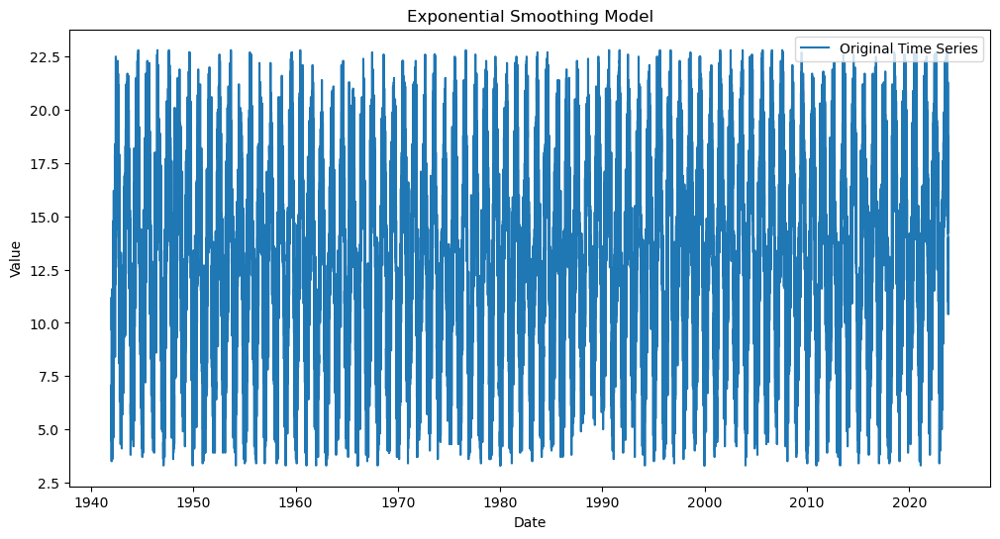

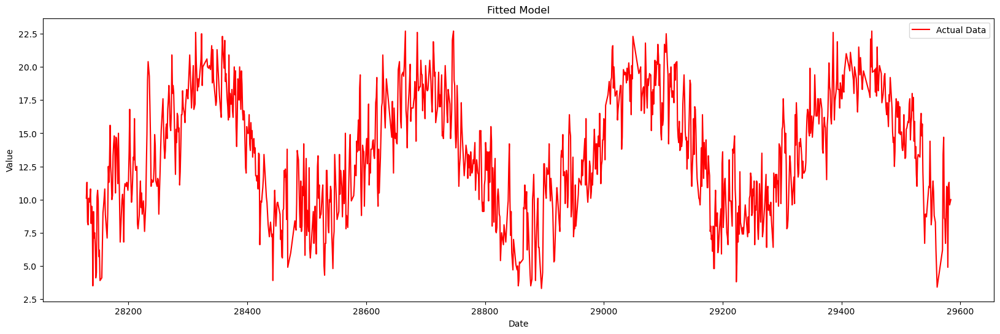

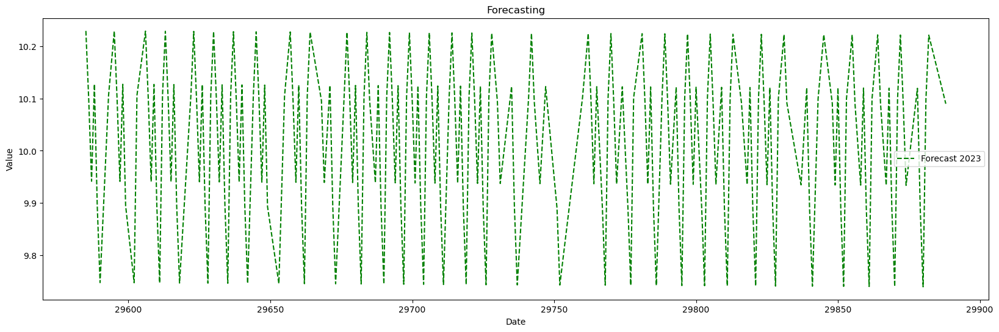

In [76]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
model = ExponentialSmoothing(train['maxtp(Maximum Air Temperature - degrees C)'], trend='add', seasonal='add', seasonal_periods=7)  
result = model.fit()
forecast_steps = len(test)
forecast = result.forecast(steps=forecast_steps)

df_no_outliers_1st['date'] = pd.to_datetime(df_no_outliers['date'])
plt.figure(figsize=(12, 6))
plt.plot(df_no_outliers_1st['date'],df_no_outliers_1st['maxtp(Maximum Air Temperature - degrees C)'], label='Original Time Series')
plt.title('Exponential Smoothing Model')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()
plt.figure(figsize=(20, 6))
plt.plot(train['maxtp(Maximum Air Temperature - degrees C)'], label='Actual Data',color='red')
plt.title('Fitted Model')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()
plt.figure(figsize=(20, 6))
plt.plot(test.index, forecast, label='Forecast 2023', linestyle='dashed', color='green')
plt.title('Forecasting')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()
plt.show()


In [77]:
print(len(test))

226


In [136]:
df_op[-1765:-304]

,maxtp(Maximum Air Temperature - degrees C)
date,
2019-01-01,9.2
2019-01-02,7.6
2019-01-03,7.9
2019-01-04,6.5
2019-01-05,8.4
...,...
2022-12-27,11.1
2022-12-28,11.3
2022-12-29,9.6


In [60]:
df_op=df_op.set_index('date')

In [61]:
final_train=df_op[-1765:-304]
final_test=df_op[-304:]

C:\Users\HP\.conda\envs\deba\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



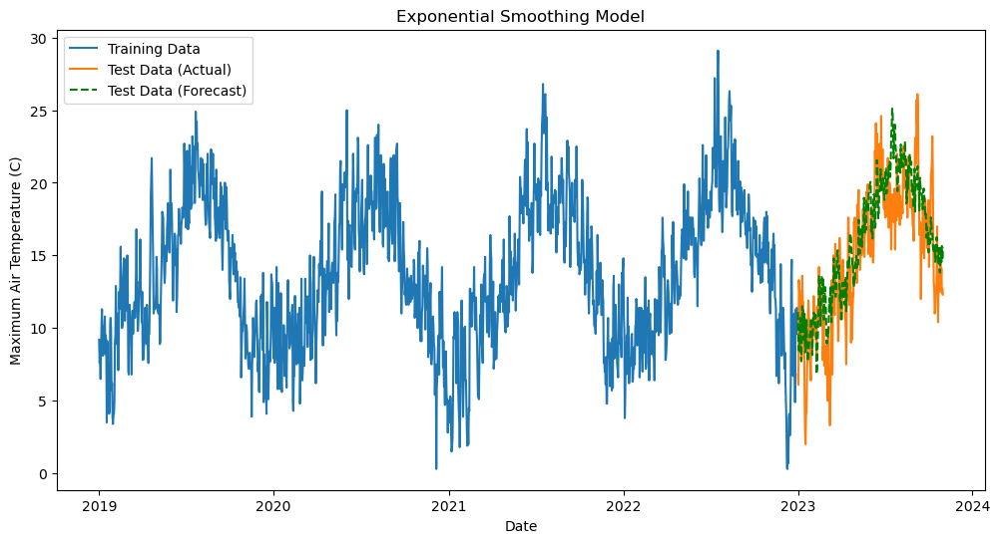

Mean Absolute Error (MAE): 2.42
Mean Squared Error (MSE): 9.18
Root Mean Squared Error (RMSE): 3.03


C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a fut

In [62]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

final_train = df_op.loc['2019-01-01':'2022-12-31']
final_test = df_op.loc['2023-01-01':]

model = ExponentialSmoothing(
    final_train['maxtp(Maximum Air Temperature - degrees C)'],
    trend='add',
    seasonal='add',
    seasonal_periods=365
)
result = model.fit(optimized=True)
test_forecast = result.forecast(steps=len(final_test))

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(final_train['maxtp(Maximum Air Temperature - degrees C)'], label='Training Data')
plt.plot(final_test['maxtp(Maximum Air Temperature - degrees C)'], label='Test Data (Actual)')
plt.plot(final_test.index, test_forecast, label='Test Data (Forecast)', linestyle='--', color='green')
plt.title('Exponential Smoothing Model')
plt.xlabel('Date')
plt.ylabel('Maximum Air Temperature (C)')
plt.legend()
plt.show()

# Evaluation metrics
mae = mean_absolute_error(final_test['maxtp(Maximum Air Temperature - degrees C)'], test_forecast)
mse = mean_squared_error(final_test['maxtp(Maximum Air Temperature - degrees C)'], test_forecast)
rmse = np.sqrt(mse)

print(f'Mean Absolute Error (MAE): {mae:.2f}')
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')


In [62]:
#train_data = train.loc['2019-01-01':'2022-12-31']
#eval_data = test.loc['2023-01-01':]
#print(train_data)

## ARIMA

C:\Users\HP\.conda\envs\deba\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No f

Best AIC: 6384.353391602375, Best Order: (1, 1, 1)
Root Mean Squared Error (RMSE): 7.56


C:\Users\HP\.conda\envs\deba\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dty

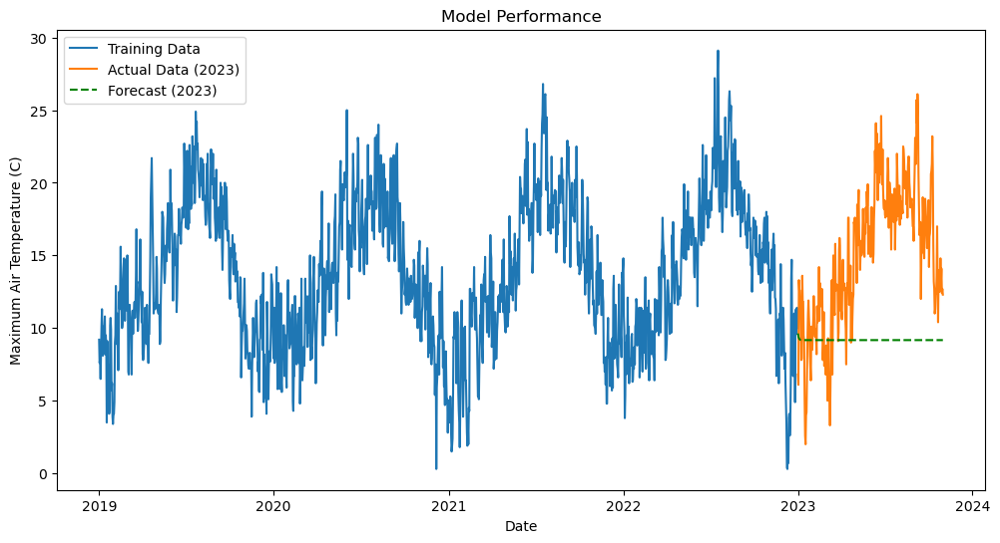

In [148]:
final_train.index.freq = 'D'
final_test.index.freq = 'D'

final_train = df_op.loc['2019-01-01':'2022-12-31']
final_test = df_op.loc['2023-01-01':]

def evaluate_model(model, final_train, final_test):
    model_fit = model.fit()

    predictions = model_fit.get_forecast(steps=len(final_test))
    predicted_mean = predictions.predicted_mean

    rmse = sqrt(mean_squared_error(final_test, predicted_mean))
    print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')

    plt.figure(figsize=(12, 6))
    plt.plot(final_train, label='Training Data')
    plt.plot(final_test, label='Actual Data (2023)')
    plt.plot(final_test.index, predicted_mean, label='Forecast (2023)', linestyle='--', color='green')
    plt.title('Model Performance')
    plt.xlabel('Date')
    plt.ylabel('Maximum Air Temperature (C)')
    plt.legend()
    plt.show()

p_values = range(0, 3)
d_values = range(0, 2)
q_values = range(0, 3)

pdq_combinations = list(itertools.product(p_values, d_values, q_values))
best_aic = float('inf')
best_order = None

for order in pdq_combinations:
    try:
        model = ARIMA(final_train['maxtp(Maximum Air Temperature - degrees C)'], order=order)
        results = model.fit()
        aic = results.aic
        if aic < best_aic:
            best_aic = aic
            best_order = order
    except:
        continue

print(f'Best AIC: {best_aic}, Best Order: {best_order}')

best_arima_model = ARIMA(final_train['maxtp(Maximum Air Temperature - degrees C)'], order=best_order)
evaluate_model(best_arima_model, final_train['maxtp(Maximum Air Temperature - degrees C)'], final_test['maxtp(Maximum Air Temperature - degrees C)'])


### SARIMA

In [182]:
import time
%%time

df_op1=df_op.diff().diff()
final_train = df_op1.loc['2019-01-01':'2022-12-31']
final_test = df_op1.loc['2023-01-01':]

def sarima_grid_search(final_train, p_values, d_values, q_values, P_values, D_values, Q_values, m_values):
    best_score, best_order = float("inf"), None

    for p, d, q, P, D, Q, m in product(p_values, d_values, q_values, P_values, D_values, Q_values, m_values):
        order = (p, d, q)
        seasonal_order = (P, D, Q, m)
        try:
            model = SARIMAX(final_train, order=order, seasonal_order=seasonal_order)
            fit = model.fit(disp=False)
            score = fit.aic
            if score < best_score:
                best_score, best_order = score, (order, seasonal_order)
        except Exception as e:
            continue

    return best_order

P_values = range(0, 5)
#D_values = range(0, 3)
Q_values = range(0, 5)
m_values = [12] 

best_order = sarima_grid_search(final_train['maxtp(Maximum Air Temperature - degrees C)'], [1], [1], [1], P_values, [2], Q_values, m_values)

sarima_model = SARIMAX(final_train['maxtp(Maximum Air Temperature - degrees C)'], order=best_order[0], seasonal_order=best_order[1])
sarima_fit = sarima_model.fit()



C:\Users\HP\.conda\envs\deba\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning:

Non-invertible starting seasonal moving average Using zeros as starting parameters.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning:

Non-invertible starting seasonal moving average Using zeros as starting parameters.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:47

CPU times: total: 56min 36s
Wall time: 15min 38s


In [164]:
test_forecast

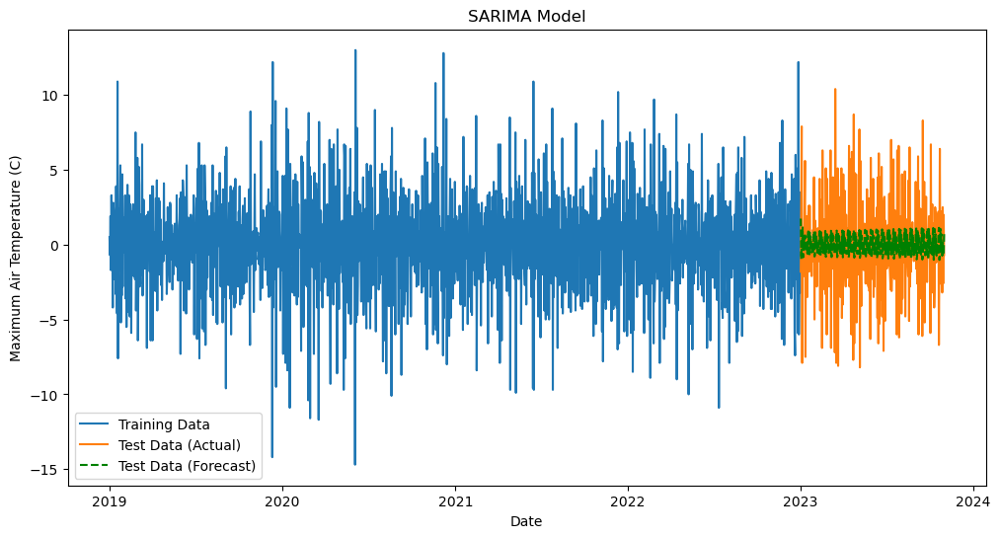


Model Evaluation Metrics:
Root Mean Squared Error (RMSE): 3.4953264933013752


C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.



In [183]:
test_forecast = sarima_fit.forecast(steps=len(final_test))
plt.figure(figsize=(12, 6))
plt.plot(final_train.index, final_train['maxtp(Maximum Air Temperature - degrees C)'], label='Training Data')
plt.plot(final_test.index, final_test['maxtp(Maximum Air Temperature - degrees C)'], label='Test Data (Actual)')
plt.plot(final_test.index, test_forecast, label='Test Data (Forecast)', linestyle='--', color='green')
plt.title('SARIMA Model')
plt.xlabel('Date')
plt.ylabel('Maximum Air Temperature (C)')
plt.legend()
plt.show()
rmse_value = sqrt(mean_squared_error(final_test['maxtp(Maximum Air Temperature - degrees C)'], test_forecast))
print("\nModel Evaluation Metrics:")
print(f"Root Mean Squared Error (RMSE): {rmse_value}")

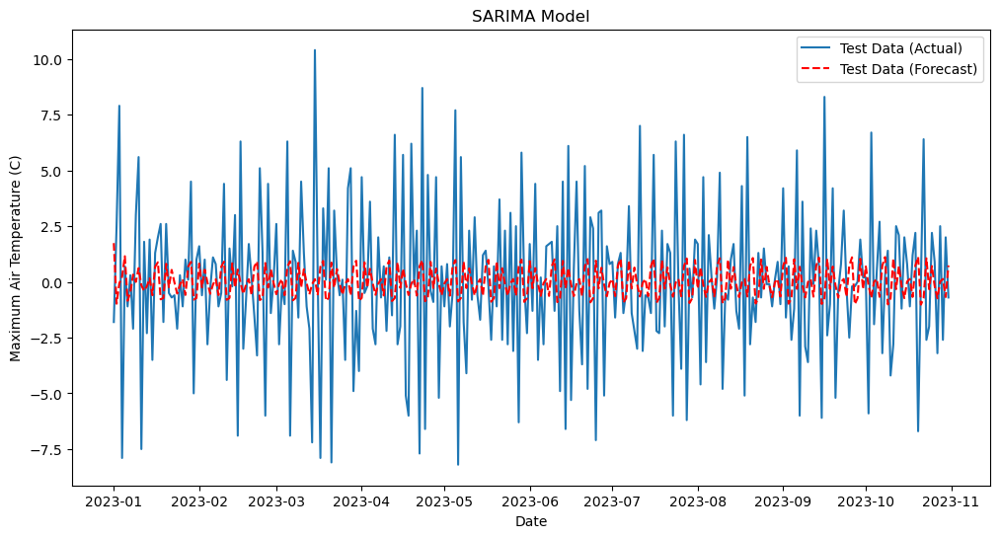

In [185]:
plt.figure(figsize=(12, 6))
plt.plot(final_test.index, final_test['maxtp(Maximum Air Temperature - degrees C)'], label='Test Data (Actual)')
plt.plot(final_test.index, test_forecast, label='Test Data (Forecast)', linestyle='--', color='red')
plt.title('SARIMA Model')
plt.xlabel('Date')
plt.ylabel('Maximum Air Temperature (C)')
plt.legend()
plt.show()

# Model Diagnostics

In [186]:
print("\nModel Diagnostics:")
print(sarima_fit.summary())
print("\nLjung-Box Test for Residuals Autocorrelation:")
residuals = sarima_fit.resid
lb_test_stat, lb_p_value = acorr_ljungbox(residuals)
print(f"Ljung-Box Test Statistic: {lb_test_stat}")
print(f"P-value: {lb_p_value}")


Model Diagnostics:
                                           SARIMAX Results                                            
Dep. Variable:     maxtp(Maximum Air Temperature - degrees C)   No. Observations:                 1461
Model:                 SARIMAX(1, 1, 1)x(0, 2, [1, 2, 3], 12)   Log Likelihood               -3739.146
Date:                                        Sun, 31 Dec 2023   AIC                           7490.292
Time:                                                00:56:34   BIC                           7521.910
Sample:                                            01-01-2019   HQIC                          7502.097
                                                 - 12-31-2022                                         
Covariance Type:                                          opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------

# Model Evaluation

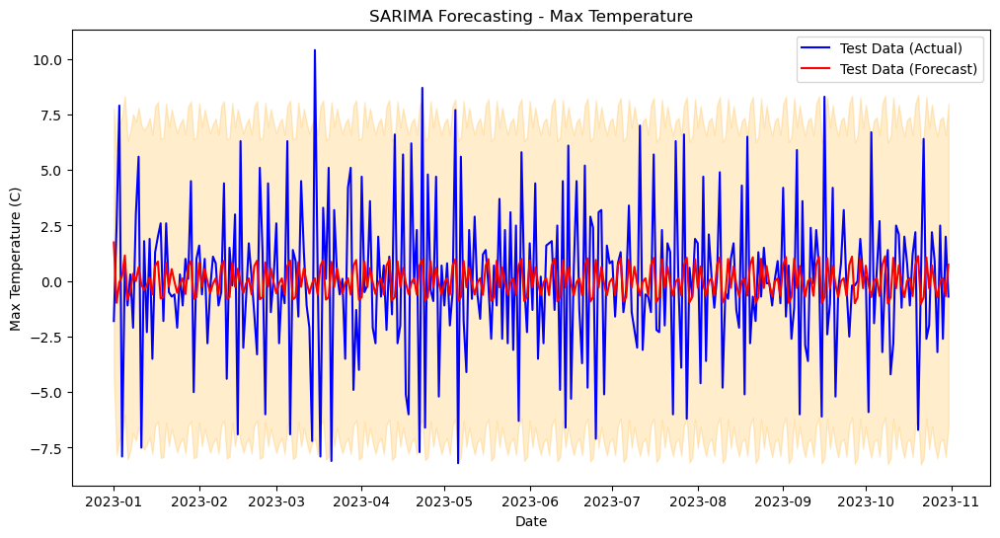


Model Evaluation Metrics:-
Root Mean Squared Error (RMSE): 3.4953264933013752


C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.



In [206]:
train_data = df_op1.loc['2019-01-01':'2022-12-31']
test_data = df_op1.loc['2023-01-01':'2023-10-31']
forecast_steps = len(test_data)
forecast = sarima_fit.get_forecast(steps=forecast_steps)
forecast_ci = forecast.conf_int()
plt.figure(figsize=(12, 6))
plt.plot(test_data['maxtp(Maximum Air Temperature - degrees C)'], label='Test Data (Actual)', color='blue', linestyle='-')
plt.plot(forecast.predicted_mean, label='Test Data (Forecast)', linestyle='-', color='red')
plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='orange', alpha=0.2)
plt.title('SARIMA Forecasting - Max Temperature')
plt.xlabel('Date')
plt.ylabel('Max Temperature (C)')
plt.legend()
plt.show()
rmse_value = sqrt(mean_squared_error(test_data['maxtp(Maximum Air Temperature - degrees C)'], forecast.predicted_mean))
print("\nModel Evaluation Metrics:-")
print(f"Root Mean Squared Error (RMSE): {rmse_value}")

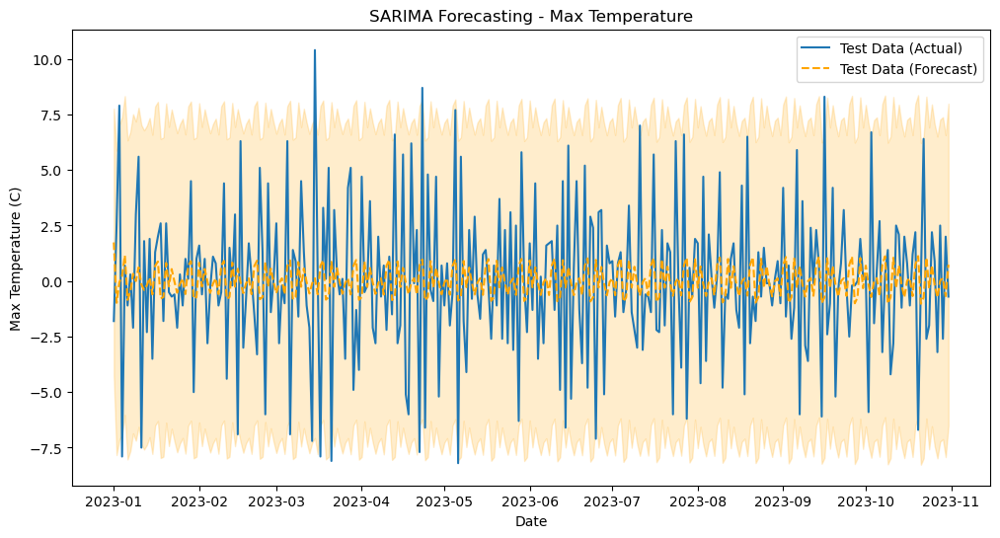


Model Evaluation Metrics:
Root Mean Squared Error (RMSE): 3.4953264933013752
Mean Squared Error (MSE): 12.22
Mean Absolute Error (MAE): 2.73


C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:614: FutureWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

C:\Users\HP\.conda\envs\deba\Lib\site-packages\sklearn\utils\validation.py:605: FutureWarning:

is_sparse is deprecated and will be removed in a fut

In [212]:
train_data = df_op1.loc['2019-01-01':'2022-12-31']
test_data = df_op1.loc['2023-01-01':'2023-10-31']

forecast_steps = len(test_data)
forecast = sarima_fit.get_forecast(steps=forecast_steps)
forecast_ci = forecast.conf_int()

plt.figure(figsize=(12, 6))
plt.plot(test_data['maxtp(Maximum Air Temperature - degrees C)'], label='Test Data (Actual)')
plt.plot(forecast.predicted_mean, label='Test Data (Forecast)', linestyle='--', color='orange')
plt.fill_between(forecast_ci.index, forecast_ci.iloc[:, 0], forecast_ci.iloc[:, 1], color='orange', alpha=0.2)
plt.title('SARIMA Forecasting - Max Temperature')
plt.xlabel('Date')
plt.ylabel('Max Temperature (C)')
plt.legend()
plt.show()
rmse_value = sqrt(mean_squared_error(test_data['maxtp(Maximum Air Temperature - degrees C)'], forecast.predicted_mean))
print("\nModel Evaluation Metrics:")
print(f"Root Mean Squared Error (RMSE): {rmse_value}")
mse = mean_squared_error(test_data['maxtp(Maximum Air Temperature - degrees C)'], forecast.predicted_mean)
mae = mean_absolute_error(test_data['maxtp(Maximum Air Temperature - degrees C)'], forecast.predicted_mean)
print(f'Mean Squared Error (MSE): {mse:.2f}')
print(f'Mean Absolute Error (MAE): {mae:.2f}')
